In [1]:
import numpy as np
import scipy.special
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.widgets import Slider, Button, RadioButtons

In [2]:
print(np.roots([1, 6, 8]))
print(np.roots([1, 6, -8]))
print(np.roots([2, 12, -16]))
print(np.roots([1, 6, 100]))

[-4. -2.]
[-7.12310563  1.12310563]
[-7.12310563  1.12310563]
[-3.+9.53939201j -3.-9.53939201j]


[-3. -3.] [ 9.53939201 -9.53939201]


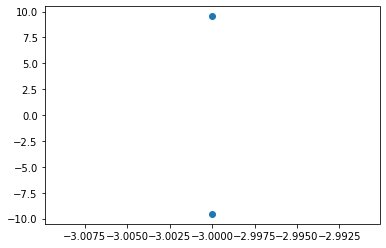

In [3]:
roots = np.roots([1, 6, 100])
fig, ax = plt.subplots()
ax.scatter(roots.real, roots.imag)
print(roots.real, roots.imag)

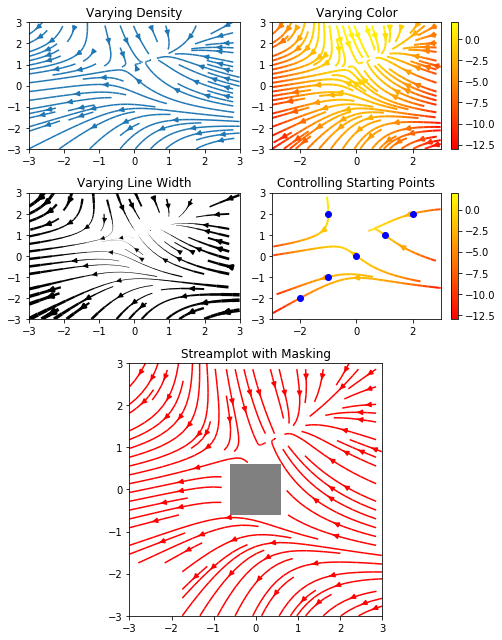

In [4]:
w = 3
Y, X = np.mgrid[-w:w:100j, -w:w:100j]
U = -1 - X**2 + Y
V = 1 + X - Y**2
speed = np.sqrt(U**2 + V**2)

fig = plt.figure(figsize=(7, 9))
gs = gridspec.GridSpec(nrows=3, ncols=2, height_ratios=[1, 1, 2])

#  Varying density along a streamline
ax0 = fig.add_subplot(gs[0, 0])
ax0.streamplot(X, Y, U, V, density=[0.5, 1])
ax0.set_title('Varying Density')

# Varying color along a streamline
ax1 = fig.add_subplot(gs[0, 1])
strm = ax1.streamplot(X, Y, U, V, color=U, linewidth=2, cmap='autumn')
fig.colorbar(strm.lines)
ax1.set_title('Varying Color')

#  Varying line width along a streamline
ax2 = fig.add_subplot(gs[1, 0])
lw = 5*speed / speed.max()
ax2.streamplot(X, Y, U, V, density=0.6, color='k', linewidth=lw)
ax2.set_title('Varying Line Width')

# Controlling the starting points of the streamlines
seed_points = np.array([[-2, -1, 0, 1, 2, -1], [-2, -1,  0, 1, 2, 2]])

ax3 = fig.add_subplot(gs[1, 1])
strm = ax3.streamplot(X, Y, U, V, color=U, linewidth=2,
                     cmap='autumn', start_points=seed_points.T)
fig.colorbar(strm.lines)
ax3.set_title('Controlling Starting Points')

# Displaying the starting points with blue symbols.
ax3.plot(seed_points[0], seed_points[1], 'bo')
ax3.set(xlim=(-w, w), ylim=(-w, w))

# Create a mask
mask = np.zeros(U.shape, dtype=bool)
mask[40:60, 40:60] = True
U[:20, :20] = np.nan
U = np.ma.array(U, mask=mask)

ax4 = fig.add_subplot(gs[2:, :])
ax4.streamplot(X, Y, U, V, color='r')
ax4.set_title('Streamplot with Masking')

ax4.imshow(~mask, extent=(-w, w, -w, w), alpha=0.5,
          interpolation='nearest', cmap='gray', aspect='auto')
ax4.set_aspect('equal')

plt.tight_layout()
plt.show()

In [5]:
"""
%matplotlib widget

fig, ax = plt.subplots()
plt.subplots_adjust(left=0.25, bottom=0.25)
t = np.arange(0.0, 1.0, 0.001)
a0 = 5
f0 = 3
delta_f = 5.0
s = a0 * np.sin(2 * np.pi * f0 * t)
l, = plt.plot(t, s, lw=2)
ax.margins(x=0)

axcolor = 'lightgoldenrodyellow'
axfreq = plt.axes([0.25, 0.1, 0.65, 0.03], facecolor=axcolor)
axamp = plt.axes([0.25, 0.15, 0.65, 0.03], facecolor=axcolor)

sfreq = Slider(axfreq, 'Freq', 0.1, 30.0, valinit=f0, valstep=delta_f)
samp = Slider(axamp, 'Amp', 0.1, 10.0, valinit=a0)


def update(val):
    amp = samp.val
    freq = sfreq.val
    l.set_ydata(amp*np.sin(2*np.pi*freq*t))
    fig.canvas.draw_idle()


sfreq.on_changed(update)
samp.on_changed(update)

resetax = plt.axes([0.8, 0.025, 0.1, 0.04])
button = Button(resetax, 'Reset', color=axcolor, hovercolor='0.975')


def reset(event):
    sfreq.reset()
    samp.reset()
button.on_clicked(reset)

rax = plt.axes([0.025, 0.5, 0.15, 0.15], facecolor=axcolor)
radio = RadioButtons(rax, ('red', 'blue', 'green'), active=0)


def colorfunc(label):
    l.set_color(label)
    fig.canvas.draw_idle()
radio.on_clicked(colorfunc)

plt.show()
"""

"\n%matplotlib widget\n\nfig, ax = plt.subplots()\nplt.subplots_adjust(left=0.25, bottom=0.25)\nt = np.arange(0.0, 1.0, 0.001)\na0 = 5\nf0 = 3\ndelta_f = 5.0\ns = a0 * np.sin(2 * np.pi * f0 * t)\nl, = plt.plot(t, s, lw=2)\nax.margins(x=0)\n\naxcolor = 'lightgoldenrodyellow'\naxfreq = plt.axes([0.25, 0.1, 0.65, 0.03], facecolor=axcolor)\naxamp = plt.axes([0.25, 0.15, 0.65, 0.03], facecolor=axcolor)\n\nsfreq = Slider(axfreq, 'Freq', 0.1, 30.0, valinit=f0, valstep=delta_f)\nsamp = Slider(axamp, 'Amp', 0.1, 10.0, valinit=a0)\n\n\ndef update(val):\n    amp = samp.val\n    freq = sfreq.val\n    l.set_ydata(amp*np.sin(2*np.pi*freq*t))\n    fig.canvas.draw_idle()\n\n\nsfreq.on_changed(update)\nsamp.on_changed(update)\n\nresetax = plt.axes([0.8, 0.025, 0.1, 0.04])\nbutton = Button(resetax, 'Reset', color=axcolor, hovercolor='0.975')\n\n\ndef reset(event):\n    sfreq.reset()\n    samp.reset()\nbutton.on_clicked(reset)\n\nrax = plt.axes([0.025, 0.5, 0.15, 0.15], facecolor=axcolor)\nradio = RadioB

(100, 100) (100, 100) (100, 100)


Text(0.5, 1.0, 'x = a + bi')

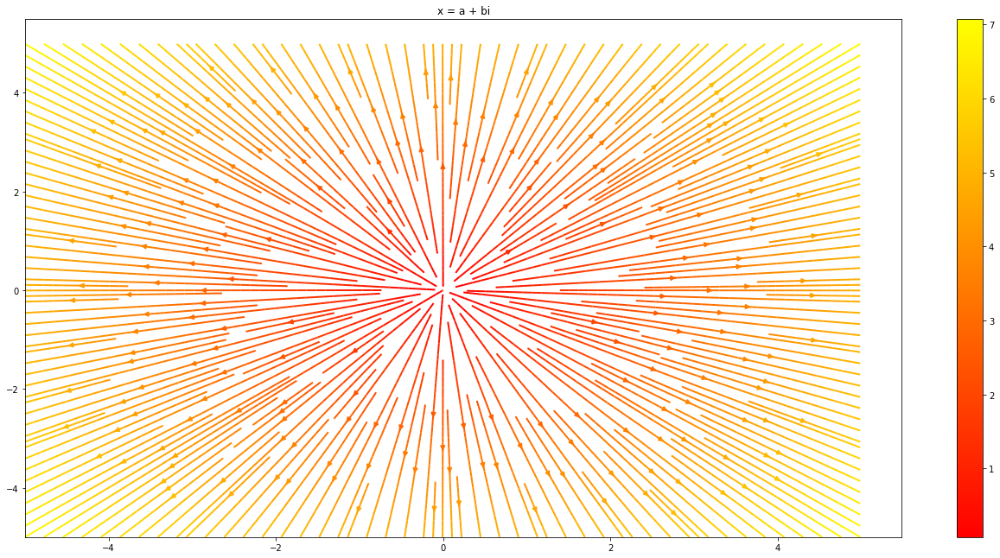

In [6]:
w = 5
Y, X = np.mgrid[-w:w:100j, -w:w:100j]
U = X
V = Y
speed = np.sqrt(U**2 + V**2)
print(U.shape, V.shape, speed.shape)

fig = plt.figure(figsize=(50, 50))

#  Varying density along a streamline
ax1 = fig.add_subplot(gs[0, 0])
strm = ax1.streamplot(X, Y, U, V, density=3, color=speed, linewidth=2, cmap="autumn")
fig.colorbar(strm.lines)
ax1.set_title("x = a + bi")

(100, 100) (100, 100) (100, 100)


Text(0, 0.5, 'V: Derivative (Imaginary)')

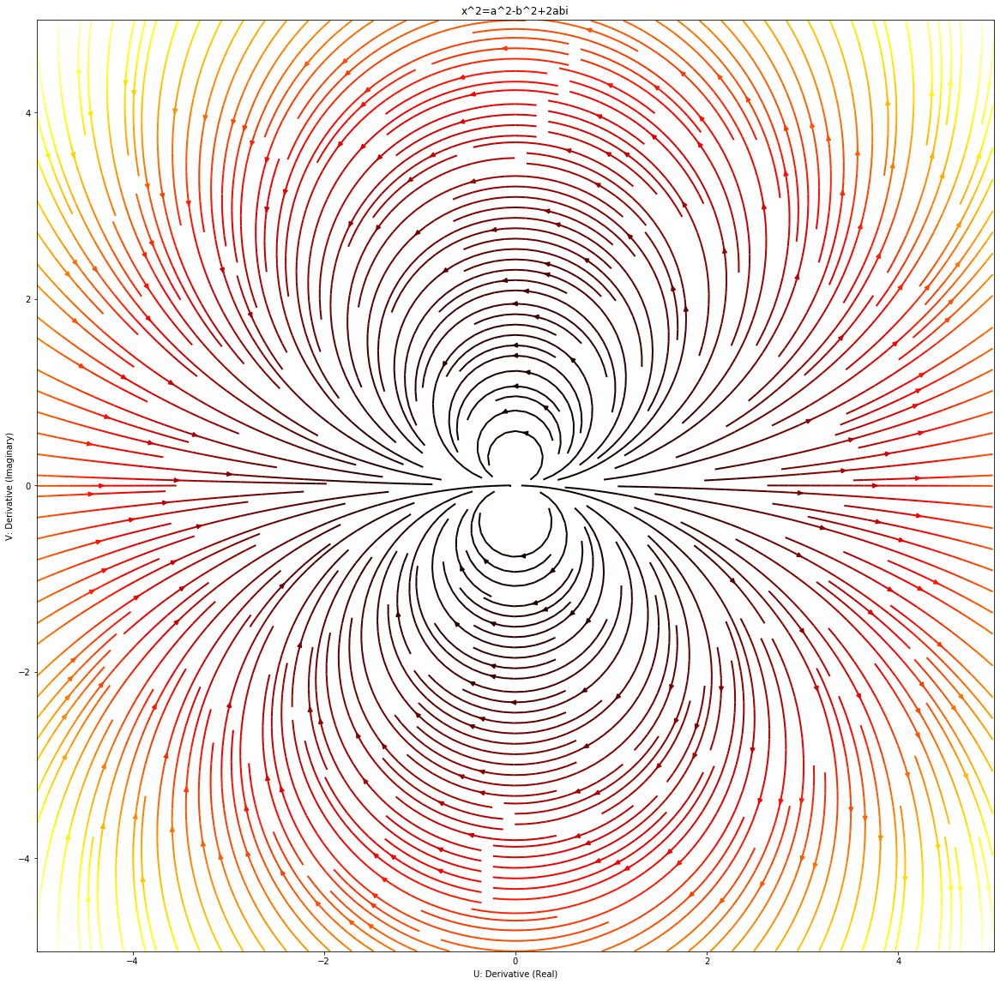

In [7]:
ABSOLUTE_LIMITS = 5
Y, X = np.mgrid[-ABSOLUTE_LIMITS:ABSOLUTE_LIMITS:100j, -ABSOLUTE_LIMITS:ABSOLUTE_LIMITS:100j]
U = X**2-Y**2
V = 2*X*Y
speed = np.sqrt(U**2 + V**2)
print(U.shape, V.shape, speed.shape)

fig = plt.figure(figsize=(20, 20))

#  Varying density along a streamline
derivs = fig.add_subplot()
derivs.streamplot(X, Y, U, V, density=3, color=speed, linewidth=2, cmap="hot")
derivs.set_title("x^2=a^2-b^2+2abi")
plt.xlabel("U: Derivative (Real)")
plt.ylabel("V: Derivative (Imaginary)")

In [8]:
np.polynomial.polynomial.polyval(2j, [1, 0, 0])

(1+0j)

In [9]:
def decompose_polynomial(polynomial, x, y):
    U = np.zeros(x.shape)
    V = np.zeros(y.shape)
    # pascal's triangle, basically
    for a in range(0, len(polynomial)):
        for b in range(0, a + 1):
            multiplier = scipy.special.comb(a, b)
            is_real = b % 2 == 0
            if b % 4 >= 2:
                multiplier *= -1
            if is_real:
                U += polynomial[-a - 1] * multiplier * x**(a - b) * y**(b)
            else:
                V += polynomial[-a - 1] * multiplier * x**(a - b) * y**(b)
            
    return (U, V)

In [10]:
def graph_polynomial_deriv(polynomial, limits, subplot, **kwargs):
    Y, X = np.mgrid[-limits:limits:1000j, -limits:limits:1000j]
    U, V = decompose_polynomial(polynomial, X, Y)
    speed = np.sqrt(U**2 + V**2)
    points = np.arange(-limits,limits,limits/100)
    stream_points = np.transpose([np.tile(points, len(points)), np.repeat(points, len(points))])

    subplot.streamplot(X, Y, U, V, color=speed, start_points=stream_points, cmap="hot", **kwargs)

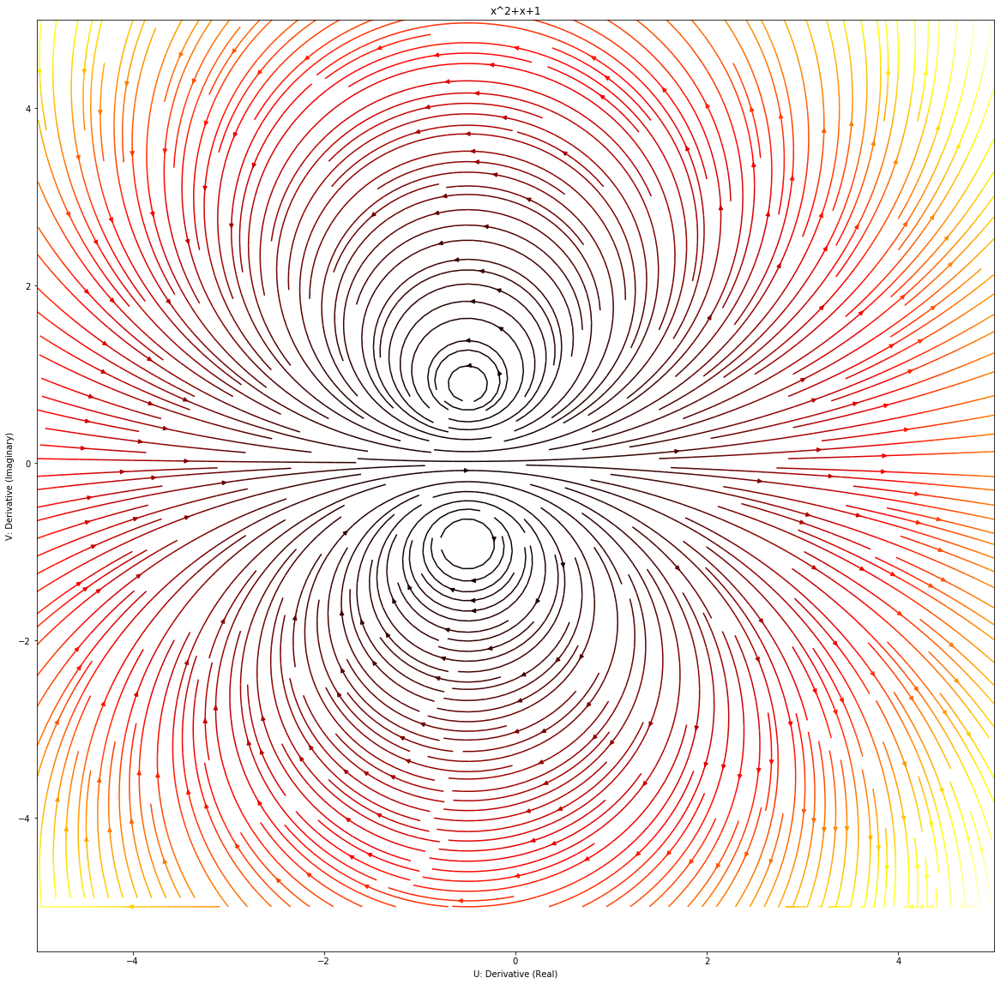

In [11]:
fig = plt.figure(figsize=(20, 20))
subplot = fig.add_subplot()
plt.xlabel("U: Derivative (Real)")
plt.ylabel("V: Derivative (Imaginary)")
subplot.set_title("x^2+x+1")
graph_polynomial_deriv([1, 1, 1], 5, subplot, density=3)

Roots: [-4.79128785 -0.20871215]


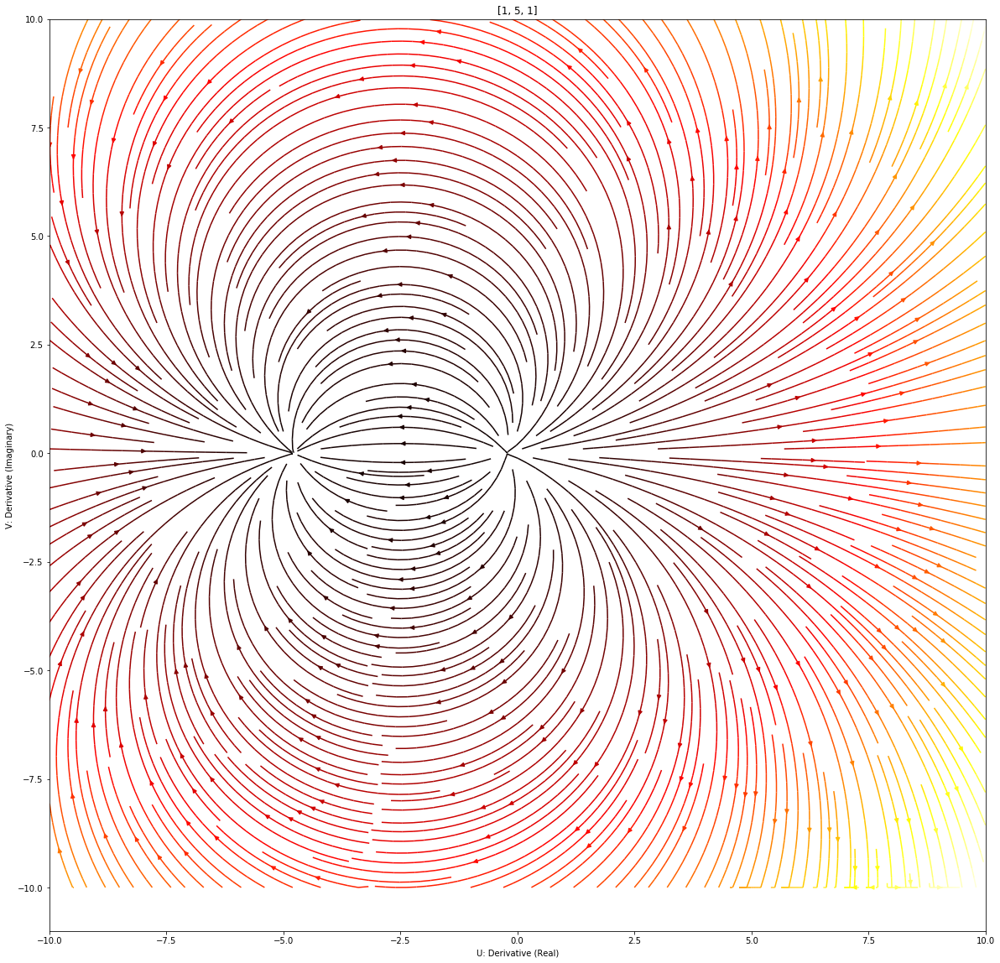

In [12]:
fig = plt.figure(figsize=(20, 20))
subplot = fig.add_subplot()
plt.xlabel("U: Derivative (Real)")
plt.ylabel("V: Derivative (Imaginary)")
polynomial = [1, 5, 1]
subplot.set_title(polynomial)
graph_polynomial_deriv(polynomial, 10, subplot, density=3)
print("Roots:", np.roots(polynomial))

In [22]:
def easy_plot(polynomial, limit=None, **kwargs):
    fig = plt.figure(figsize=(20, 20))
    subplot = fig.add_subplot()
    plt.xlabel("U: Real")
    plt.ylabel("V: Imaginary")
    subplot.set_title(polynomial)
    roots = np.roots(polynomial)
    subplot.scatter(roots.real, roots.imag)
    if limit == None: limit = max(max(np.max(np.absolute(roots.real)), np.max(np.absolute(roots.imag))) * 1.5, 1)
    graph_polynomial_deriv(polynomial, limit, subplot, **kwargs)
    print("Roots:", roots)

Roots: [-1.00000000e+00+0.j -7.77156117e-16+1.j -7.77156117e-16-1.j]


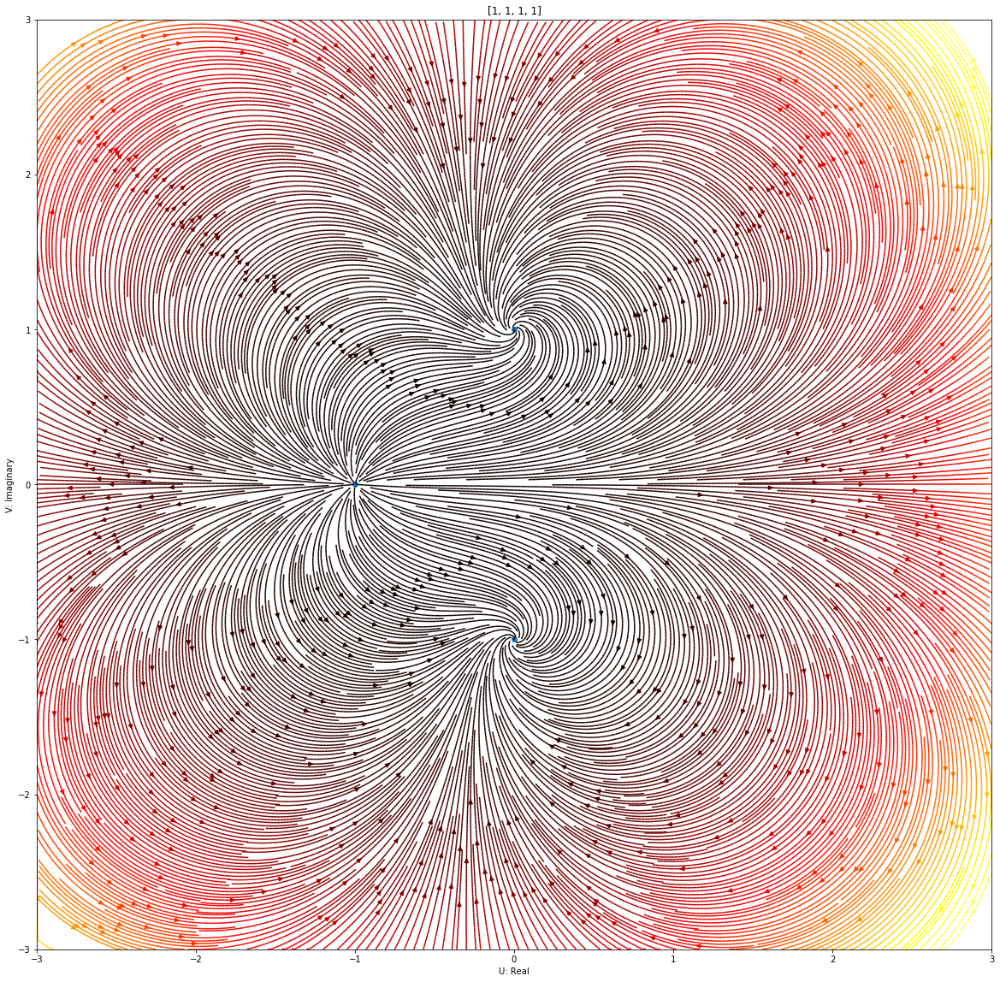

In [14]:
easy_plot([1, 1, 1, 1], 3, density=10)

Roots: [ 2.25980358+11.30835789j  2.25980358-11.30835789j
 -7.51960716 +0.j        ]


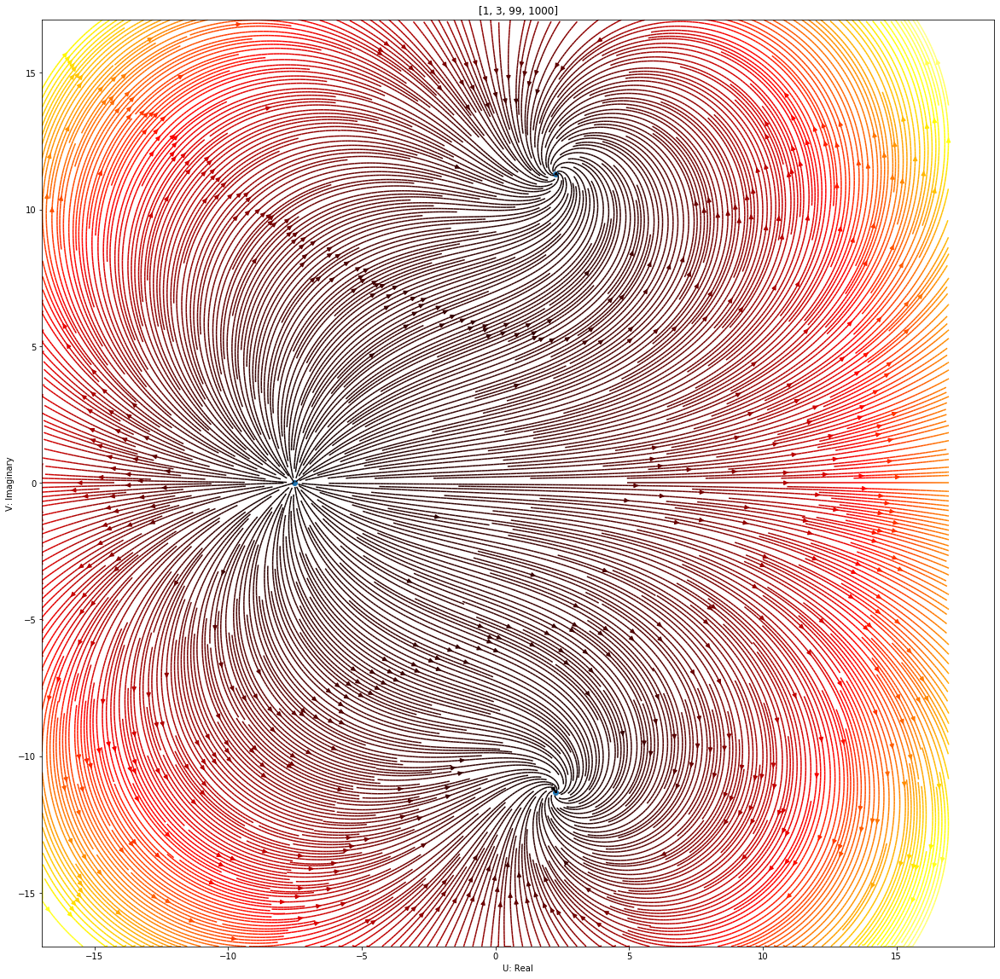

In [15]:
easy_plot([1, 3, 99, 1000], density=10)

Roots: [-55.94350671+0.j          -2.65423532+0.j
   1.29887101+2.24666862j   1.29887101-2.24666862j]


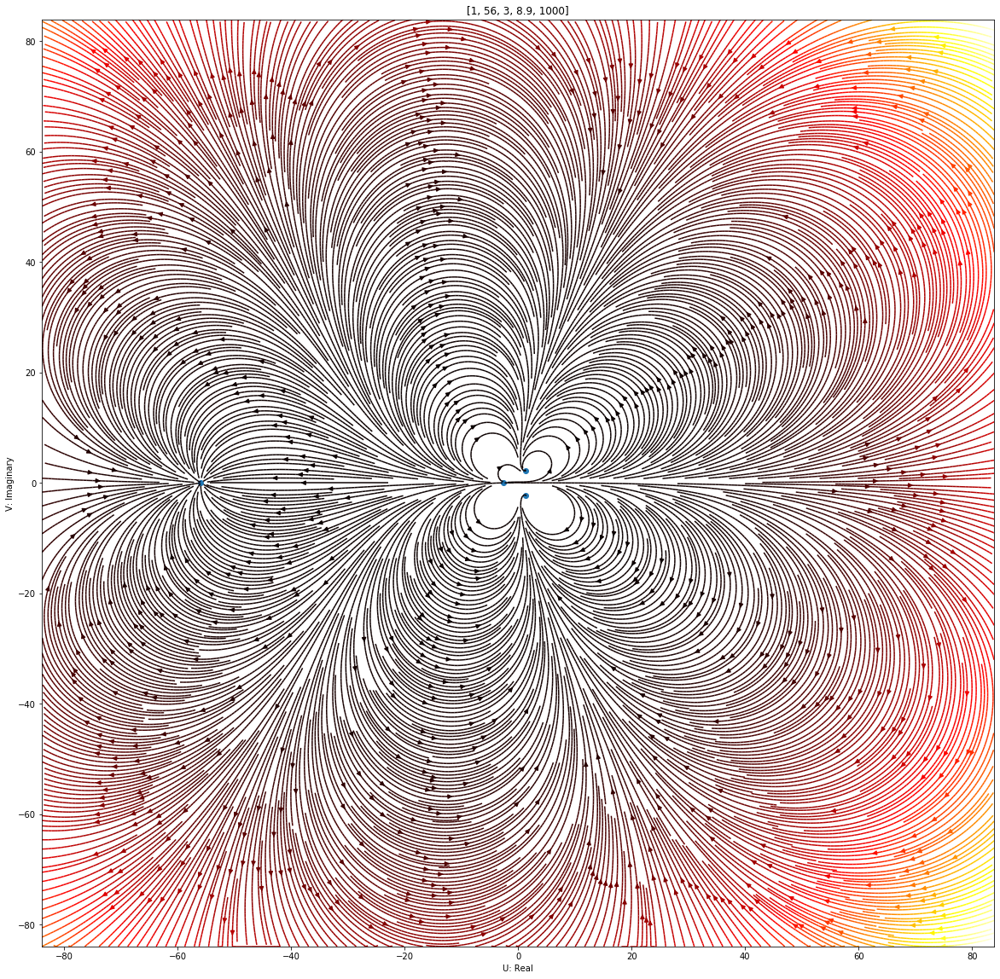

In [16]:
easy_plot([1, 56, 3, 8.9, 1000], density=10)

Roots: [0.]


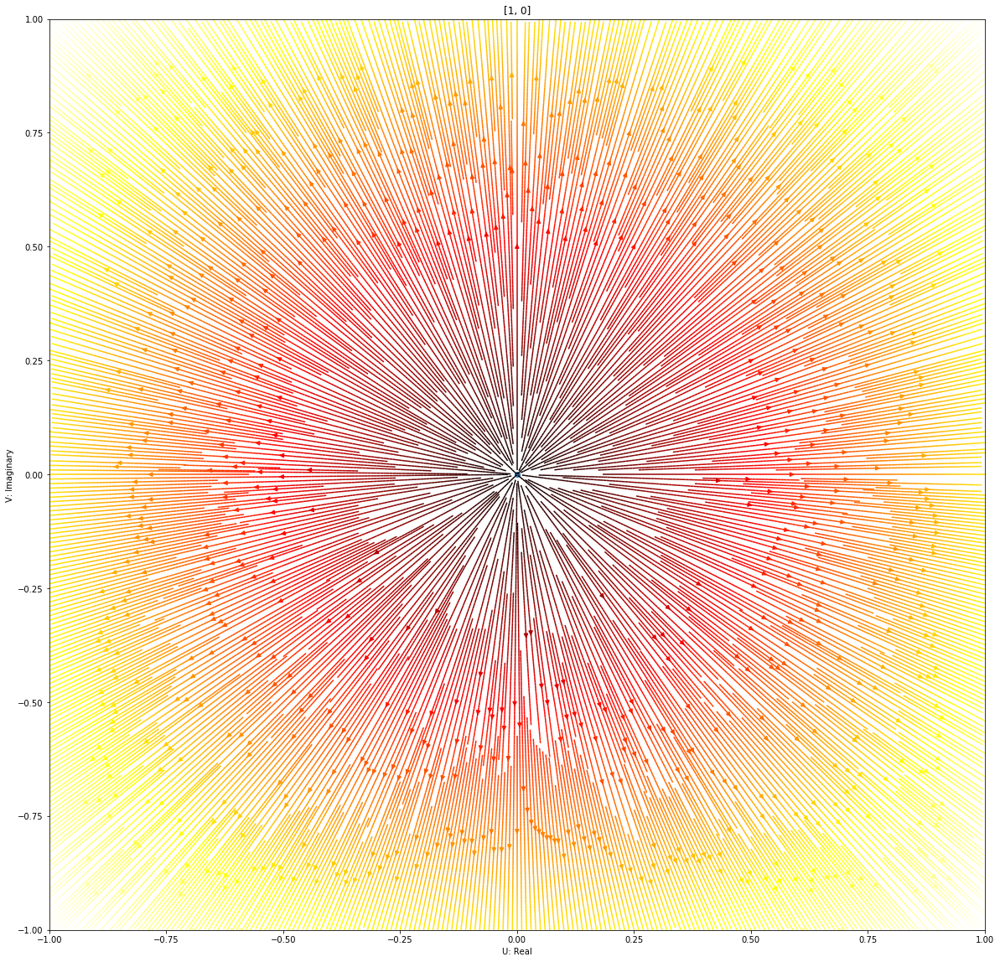

In [23]:
easy_plot([1, 0], density=10)